In [1]:
import os
import sys
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', 50)

from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline

import plotly
import plotly.graph_objs as go
import cufflinks as cf
cf.set_config_file(offline=True)

In [2]:
base_path = os.path.abspath('../..')
data_path = os.path.join(base_path, 'data')
database_path = os.path.join(data_path, 'database')
strategy_path = os.path.join(base_path, 'strategy')
check_path = os.path.join(strategy_path, 'check')
sys.path.append(strategy_path)

In [3]:
bloomb_data_check_path = os.path.join(base_path, 'data\\bloom_data_check\\bloom_data')

In [4]:
from strategy import CommodityStrategy, EquityStrategy, IRStrategy, EmergingStrategy
from tester import Tester

In [5]:
from CPM import CPM
from CVA import CVA
from CVA2 import CVA2
from CSS import CSS
from CVO import CVO
from CCA3 import CCA3
from CVA3 import CVA3

# Data Check

In [6]:
cindex_path = os.path.join(data_path, 'fut1return-com.CSV')
cindex2_path = os.path.join(data_path, 'BCOM.csv')

cindex = pd.read_csv(cindex_path, header=0, index_col=0, parse_dates=True)
cindex2 = pd.read_csv(cindex2_path, header=0, index_col=0, parse_dates=True)

CRet = cindex.pct_change(1).iloc[1:]
CRet2 = cindex2.pct_change(1).iloc[1:]
Cindex = (1. + CRet).cumprod()
Cindex = Cindex / Cindex.iloc[0]

start_date = '2001-01-01'
end_date = '2018-05-09'

In [7]:
gld_prc = pd.read_csv(bloomb_data_check_path + "\\gc_data_check.csv", header=0, index_col=0, parse_dates=True)

In [8]:
gld_prc.head()

,GC1 Comdty,GC2 Comdty,GC1 n:04_0_n comdty,GC1 n:04_0_r comdty
2000-01-04,283.7,285.7,283.7,449.03
2000-01-05,282.1,284.1,282.1,446.50
2000-01-06,282.4,284.4,282.4,446.97
2000-01-07,282.9,284.9,282.9,447.77
2000-01-10,282.7,284.7,282.7,447.45


먼저 R 데이터랑 골드 데이터랑 맞는지 보자

In [9]:
r_data = (1.+ CRet.loc[start_date:end_date, 'GC']).cumprod()
bloom_data = (1. + gld_prc.pct_change().loc[start_date:end_date, :]).cumprod()

In [10]:
toplot = pd.concat([r_data, bloom_data], axis=1)
toplot['diff'] = toplot.loc[:, 'GC'] - toplot.loc[:, 'GC1 n:04_0_r comdty']
toplot.iplot(secondary_y=['diff'])

In [11]:
toplot.tail()

,GC,GC1 Comdty,GC2 Comdty,GC1 n:04_0_n comdty,GC1 n:04_0_r comdty,diff
2018-05-03,3.372556,4.797880,4.775525,4.797880,3.372609,-0.000053
2018-05-04,3.377694,4.805190,4.782766,4.805190,3.377741,-0.000047
2018-05-07,3.376153,4.802997,4.780594,4.802997,3.376194,-0.000041
2018-05-08,3.375125,4.801535,4.779146,4.801535,3.375163,-0.000037
2018-05-09,3.373327,4.798977,4.776611,4.798977,3.373370,-0.000043


숫자 차이가,, 있고 데이터 차이도 좀 있으나 일단은 비슷하다고 볼 수 있다.

이제 Strategy.py에서 계산된 수치랑 비교를 해보자.

In [12]:
cpm = CPM(strategy_name="CPM", asset_type="COMMODITY")
cpm.load_index_and_return(from_db=True, save_file=True)

2020-01-15 09:51:25,405 - CPM - INFO - [STEP 0] START LOGGING CPM
2020-01-15 09:51:25,408 - CPM - INFO - [STEP 1] LOAD DATA
2020-01-15 09:51:25,409 - CPM - INFO - [STEP 1 - 1] CONNECT TO BLOOM DATABASE
2020-01-15 09:51:25,428 - CPM - INFO - [STEP 1 - 2] GET DATA FROM BLOOM DATABASE
2020-01-15 09:51:36,194 - CPM - INFO - [STEP 1 - 3] CHANGE BLOOM DATA INTO STANDARD FORMAT
2020-01-15 09:51:46,638 - CPM - INFO - [STEP 1 - 3] CHANGE BLOOM DATA INTO STANDARD FORMAT
2020-01-15 09:51:57,417 - CPM - INFO - [STEP 1 - 4] SAVE RETURN DATA INTO CSV FORMAT


In [13]:
cpm_data = (1.+ cpm.ret.loc[start_date:end_date, 'GC']).cumprod()

In [14]:
toplot = r_data.to_frame()
toplot['cpm_data'] = cpm_data
toplot['diff'] = toplot.iloc[:, 0] - toplot.iloc[:, 1]
toplot.iplot(secondary_y=['diff'])

차이의 추이가 비슷한데 그 정도가 크다.

cpm data와 bloom_data를 비교해보자.

In [16]:
toplot = pd.concat([cpm_data, bloom_data], axis=1)
#toplot['diff'] = toplot.loc[:, 'GC'] - toplot.loc[:, 'GC1 n:04_0_r comdty']
toplot.iplot()

front, next 가격을 바꿔가며 return 적용하는 로직이 그냥 안된 듯.

뭐가 잘못된걸까? DB에 제대로 올라갔나?

In [17]:
gld_prc.loc[start_date:end_date].head()

,GC1 Comdty,GC2 Comdty,GC1 n:04_0_n comdty,GC1 n:04_0_r comdty
2001-01-02,270.0,272.6,270.0,401.85
2001-01-03,269.3,271.8,269.3,400.81
2001-01-04,268.4,270.7,268.4,399.47
2001-01-05,269.0,271.3,269.0,400.37
2001-01-08,269.0,271.3,269.0,400.37


In [18]:
toplot = cpm.raw_index_recent.loc[start_date:end_date, 'GC'].to_frame()
toplot['bloom_data'] = gld_prc.loc[start_date:end_date, 'GC1 Comdty']
toplot['diff'] = toplot.iloc[:, 0] - toplot.iloc[:, 1]
toplot.iplot(secondary_y=['diff'])

In [19]:
toplot = cpm.raw_index_next.loc[start_date:end_date, 'GC'].to_frame()
toplot['bloom_data'] = gld_prc.loc[start_date:end_date, 'GC2 Comdty']
toplot['diff'] = toplot.iloc[:, 0] - toplot.iloc[:, 1]
toplot.iplot(secondary_y=['diff'])

In [20]:
toplot = gld_prc.loc[start_date:end_date, 'GC1 Comdty'].to_frame()
toplot['nxt_data'] = gld_prc.loc[start_date:end_date, 'GC2 Comdty']
toplot['diff'] = toplot.iloc[:, 0] - toplot.iloc[:, 1]
toplot.iplot(secondary_y=['diff'])

In [21]:
toplot = cpm.raw_index_recent.loc[start_date:end_date, 'GC'].to_frame()
toplot['nxt_data'] = cpm.raw_index_next.loc[start_date:end_date, 'GC']
toplot['diff'] = toplot.iloc[:, 0] - toplot.iloc[:, 1]
toplot.iplot(secondary_y=['diff'])

In [22]:
toplot = cpm.raw_index.loc[start_date:end_date, 'GC'].to_frame()
toplot['bloom_data'] = gld_prc.loc[start_date:end_date, 'GC1 n:04_0_n comdty']
toplot['diff'] = toplot.iloc[:, 0] - toplot.iloc[:, 1]
toplot.iplot(secondary_y=['diff'])

In [60]:
toplot.tail()

,GC,bloom_data,diff
tdate,,,
2018-05-03,1319.000000,1319.0,0.000000
2018-05-04,1321.000000,1321.0,0.000000
2018-05-07,1320.400024,1320.4,0.000024
2018-05-08,1320.000000,1320.0,0.000000
2018-05-09,1319.300049,1319.3,0.000049


In [23]:
gld_ret = gld_prc.pct_change()

In [24]:
i = 1

adj_ret = {}

while i < gld_prc.shape[0]:
    tday_front_diff = abs(gld_prc.loc[:, 'GC1 Comdty'].iloc[i] - gld_prc.loc[:, 'GC1 n:04_0_n comdty'].iloc[i])
    tday_next_diff = abs(gld_prc.loc[:, 'GC2 Comdty'].iloc[i] - gld_prc.loc[:, 'GC1 n:04_0_n comdty'].iloc[i])
    yday_front_diff = abs(gld_prc.loc[:, 'GC1 Comdty'].iloc[i-1] - gld_prc.loc[:, 'GC1 n:04_0_n comdty'].iloc[i-1])
    yday_next_diff = abs(gld_prc.loc[:, 'GC2 Comdty'].iloc[i-1] - gld_prc.loc[:, 'GC1 n:04_0_n comdty'].iloc[i-1])
    
    if (tday_next_diff <= tday_front_diff) & (yday_next_diff > yday_front_diff):
        adj_ret[gld_prc.index[i]] = gld_ret.loc[:, 'GC1 Comdty'].iloc[i]
    else:
        adj_ret[gld_prc.index[i]] = gld_ret.loc[:, 'GC1 n:04_0_n comdty'].iloc[i]
    
    i = i + 1

In [25]:
adj_ret = pd.Series(adj_ret)

In [26]:
cpm_data

tdate
2001-01-01    1.000000
2001-01-02    0.986842
2001-01-03    0.984284
2001-01-04    0.980994
2001-01-05    0.983187
                ...   
2018-05-03    4.797886
2018-05-04    4.805196
2018-05-07    4.803003
2018-05-08    4.801541
2018-05-09    4.798983
Name: GC, Length: 4528, dtype: float32

In [27]:
toplot = cpm_data.to_frame()
toplot['bloom_data'] = (1. + adj_ret.loc[start_date:end_date]).cumprod()
toplot['r_data'] = r_data
toplot['diff'] = toplot.iloc[:, 0] - toplot.iloc[:, 1]
toplot.iplot(secondary_y=['diff'])

In [28]:
ret_df = cpm.ret.copy()
raw_ret_df = cpm.raw_index.pct_change()
front_ret = cpm.raw_index_recent.pct_change()

for i in range(1, cpm.raw_index.shape[0] - 1):
    for j, column in enumerate(cpm.raw_index.columns):
        tday_front_diff = abs(
            cpm.raw_index_recent.iloc[i, j] - cpm.raw_index.iloc[i, j])
        tday_next_diff = abs(
            cpm.raw_index_next.iloc[i, j] - cpm.raw_index.iloc[i, j])
        yday_front_diff = abs(
            cpm.raw_index_recent.iloc[i - 1, j] - cpm.raw_index.iloc[i - 1, j])
        yday_next_diff = abs(
            cpm.raw_index_next.iloc[i - 1, j] - cpm.raw_index.iloc[i - 1, j])

        if (tday_next_diff <= tday_front_diff) & (yday_next_diff > yday_front_diff):
            ret_df.loc[cpm.raw_index.index[i], column] = front_ret.iloc[i, j]
        else:
            ret_df.loc[cpm.raw_index.index[i], column] = raw_ret_df.iloc[i, j]
            
idx_df = (1 + ret_df.loc[start_date:end_date]).cumprod()

In [29]:
toplot = cpm_data.to_frame()
toplot['bloom_data'] = (1. + adj_ret.loc[start_date:end_date]).cumprod()
toplot['r_data'] = r_data
toplot['new_cal'] = idx_df.loc[:, 'GC']
toplot['diff'] = toplot.iloc[:, 0] - toplot.iloc[:, 1]
toplot.iplot(secondary_y=['diff'])

# 1. CPM

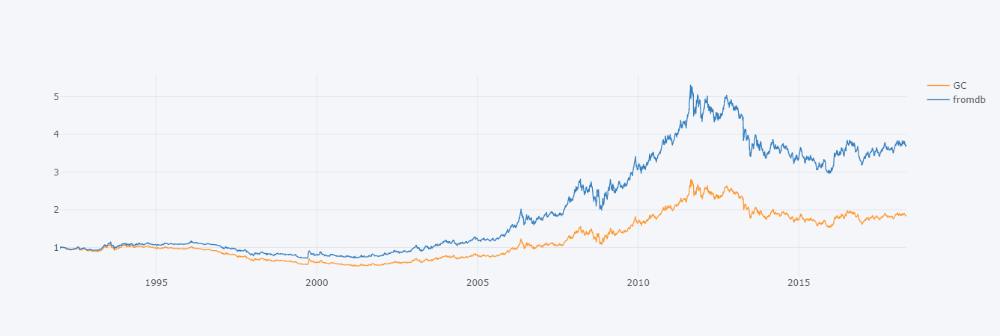

In [13]:
toplot = Cindex.loc[:,'GC'].to_frame()
toplot['fromdb'] = cpm.index['GC'].loc[Cindex.index]
toplot
toplot.iplot()

In [5]:
cpm = CPM(strategy_name="CPM", asset_type="COMMODITY")
cpm.load_index_and_return(from_db=True, save_file=True)
cpm.set_rebalance_period(ts_freq='week', cs_freq='week', rebalance_weekday=1)  # rebalance_day: monday = 0, sunday = 6 
cpm.calculate_signal(CS=0.35, minobs=52, longlen=52, shortlen=17)
cpm.set_portfolio_parameter(cs_strategy_type='vol')
cpm.make_portfolio()

2020-01-14 08:26:34,311 - CPM - INFO - [STEP 0] START LOGGING CPM
2020-01-14 08:26:34,313 - CPM - INFO - [STEP 1] LOAD DATA
2020-01-14 08:26:34,314 - CPM - INFO - [STEP 1 - 1] CONNECT TO BLOOM DATABASE
2020-01-14 08:26:34,322 - CPM - INFO - [STEP 1 - 2] GET DATA FROM BLOOM DATABASE
2020-01-14 08:26:43,381 - CPM - INFO - [STEP 1 - 3] CHANGE BLOOM DATA INTO STANDARD FORMAT
2020-01-14 08:26:52,270 - CPM - INFO - [STEP 1 - 3] CHANGE BLOOM DATA INTO STANDARD FORMAT
2020-01-14 08:27:23,928 - CPM - INFO - [STEP 1 - 4] SAVE RETURN DATA INTO CSV FORMAT


Index(['BO', 'C', 'CL', 'CT', 'GC', 'HG', 'KC', 'NG', 'S', 'SB', 'SI', 'SM',
       'W', 'XBW'],
      dtype='object', name='ticker')
Index(['BO', 'C', 'CL', 'CT', 'GC', 'HG', 'KC', 'NG', 'S', 'SB', 'SI', 'SM',
       'W', 'XBW'],
      dtype='object', name='ticker')


2020-01-14 08:27:24,291 - CPM - INFO - [STEP 2] SET REBALANCE PERIOD
2020-01-14 08:27:24,292 - CPM - INFO - [STEP 3] CACULATE SIGNAL
2020-01-14 08:27:24,292 - CPM - INFO - [STEP 2 - 1] CACULATE SIGNAL FOR WEATHER GROUP
2020-01-14 08:27:25,107 - CPM - INFO - [STEP 2 - 2] CACULATE SIGNAL FOR NOT WEATHER GROUP
C:\Users\jungyoon.choi\Desktop\jungyoon\project\risk_premia\python\strategy\CPM.py:186: FutureWarning:


Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike

C:\Users\jungyoon.choi\Desktop\jungyoon\project\risk_premia\python\strategy\CPM.py:187: FutureWarning:


Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide

In [6]:
start_date = '2001-01-01'
end_date = '2018-05-09'

# get r results
cpm_comp_df = pd.read_csv('./past/cpm.csv', header=0, index_col=0, parse_dates=True)
cpm_lag_comp_df = pd.read_csv('./past/cpm_lag.csv', header=0, index_col=0, parse_dates=True)

In [7]:
tester = Tester(cpm)
tester.set_period(start=start_date, end=end_date)
tester.run(save_file=False)

2020-01-14 08:28:41,566 - CPM - INFO - [STEP 6] START BACKTEST
2020-01-14 08:28:41,566 - CPM - INFO - [STEP 6 - 1] BACKTEST CPM TIME SERIES
2020-01-14 08:28:43,485 - CPM - INFO - [STEP 6 - 2] BACKTEST CPM CROSS SECTIONAL


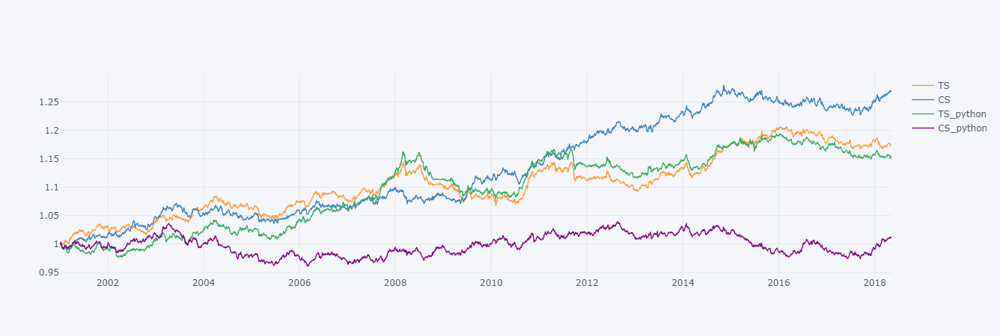

In [8]:
to_plot = (1.+ cpm_lag_comp_df).loc[start_date:].cumprod()
to_plot['TS_python'] = tester.strategy.TS_result
to_plot['CS_python'] = tester.strategy.CS_result
to_plot.iplot()

# 2. CVA

In [ ]:
cva = CVA(strategy_name="CVA", asset_type="COMMODITY")
cva.load_index_and_return(from_db=False, save_file=False)
cva.set_rebalance_period(ts_freq='week', cs_freq='week', rebalance_weekday=1)  # rebalance_day: monday = 0, sunday = 6
cva.calculate_signal(CS=0.35, nopos=0.6, lookback_period=63)
cva.set_portfolio_parameter(cs_strategy_type='vol', min_vol=0.15)
cva.make_portfolio()

In [ ]:
start_date = '2001-01-01'
end_date = '2018-05-09'

# get r results
cva_comp_df = pd.read_csv('./past/cva.csv', header=0, index_col=0, parse_dates=True)
cva_lag_comp_df = pd.read_csv('./past/cva_lag.csv', header=0, index_col=0, parse_dates=True)

In [ ]:
tester = Tester(cva)
tester.set_period(start=start_date, end=end_date)
tester.run(save_file=False)

In [ ]:
to_plot = (1.+ cva_lag_comp_df).loc[start_date:].cumprod()
to_plot['TS_python'] = tester.strategy.TS_result
to_plot['CS_python'] = tester.strategy.CS_result
to_plot.iplot()

# 3. CVO

In [ ]:
cvo = CVO(strategy_name="CVO", asset_type="COMMODITY")
cvo.load_index_and_return(from_db=False, save_file=False)
cvo.set_rebalance_period(ts_freq='week', cs_freq='week', rebalance_weekday=1)  # rebalance_day: monday = 0, sunday = 6
cvo.calculate_signal(CS=0.35, nopos=0.4, minobs=52)
cvo.set_portfolio_parameter(cs_strategy_type='vol')
cvo.make_portfolio()

In [ ]:
start_date = '2001-01-01'
end_date = '2018-05-09'

# get r results
cvo_comp_df = pd.read_csv('./past/cvo.csv', header=0, index_col=0, parse_dates=True)
cvo_lag_comp_df = pd.read_csv('./past/cvo_lag.csv', header=0, index_col=0, parse_dates=True)

In [ ]:
tester = Tester(cvo)
tester.set_period(start=start_date, end=end_date)
tester.run(save_file=False)

In [ ]:
to_plot = (1.+ cvo_lag_comp_df).loc[start_date:].cumprod()
to_plot['TS_python'] = tester.strategy.TS_result
to_plot['CS_python'] = tester.strategy.CS_result
to_plot.iplot()

# 4. CCA3

In [ ]:
cca3 = CCA3(strategy_name="CCA3", asset_type="COMMODITY")
cca3.load_index_and_return(from_db=False, save_file=False)
cca3.load_strategy_data(origin1='carry-com', origin2='carry-com2')
cca3.set_rebalance_period(ts_freq='month', cs_freq='month', rebalance_weekday=1)
cca3.calculate_signal(CS=0.35, nopos=0.4, minobs=60)
cca3.set_portfolio_parameter(cs_strategy_type='vol', min_vol=0.15)
cca3.make_portfolio()

In [ ]:
start_date = '2001-01-01'
end_date = '2018-05-09'

# get r results
cca3_comp_df = pd.read_csv('./past/cca3.csv', header=0, index_col=0, parse_dates=True)
cca3_lag_comp_df = pd.read_csv('./past/cca3_lag.csv', header=0, index_col=0, parse_dates=True)

In [ ]:
tester = Tester(cca3)
tester.set_period(start=start_date, end=end_date)
tester.run(save_file=False)

In [ ]:
to_plot = (1.+ cca3_lag_comp_df).loc[start_date:].cumprod()
to_plot['TS_python'] = tester.strategy.TS_result
to_plot['CS_python'] = tester.strategy.CS_result
to_plot.iplot()

# 5. CVA3

In [ ]:
cva3 = CVA3(strategy_name="CVA3", asset_type="COMMODITY")
cva3.load_index_and_return(from_db=False, save_file=False)
cva3.load_strategy_data1(table='bloom', origin='fx')
cva3.load_strategy_data2(table='past', origin='fut1price-com')
cva3.set_rebalance_period(ts_freq='month', cs_freq='month')  # rebalance_day: monday = 0, sunday = 6
cva3.calculate_signal(CS=0.35, nopos=0.4, minobs=60, minobs1=12, SMA=1, LMA=12, Lwindow=54)
cva3.set_portfolio_parameter(cs_strategy_type='vol', min_vol=0.15)
cva3.make_portfolio()

In [ ]:
start_date = '2001-01-01'
end_date = '2018-05-09'

# get r results
cva3_comp_df = pd.read_csv('./past/cva3.csv', header=0, index_col=0, parse_dates=True)
cva3_lag_comp_df = pd.read_csv('./past/cva3_lag.csv', header=0, index_col=0, parse_dates=True)

In [ ]:
tester = Tester(cva3)
tester.set_period(start=start_date, end=end_date)
tester.run(save_file=False)

In [ ]:
to_plot = (1.+ cva_lag_comp_df).loc[start_date:].cumprod()
to_plot['TS_python'] = tester.strategy.TS_result
to_plot['CS_python'] = tester.strategy.CS_result
to_plot.iplot()

# 6. CVA2

In [ ]:
cva2 = CVA2(strategy_name="CVA2", asset_type="COMMODITY")
cva2.load_index_and_return(from_db=False, save_file=False)
cva2.load_strategy_data(table='bloom', origin='commo pos')
cva2.set_rebalance_period(ts_freq='week', cs_freq='week')
cva2.calculate_signal(CS=0.35, nopos=0.4, minobs1=12)
cva2.set_portfolio_parameter(cs_strategy_type='vol')
cva2.make_portfolio()

In [ ]:
start_date = '2001-01-01'
end_date = '2018-05-09'

# get r results
cva2_comp_df = pd.read_csv('./past/cva2.csv', header=0, index_col=0, parse_dates=True)
cva2_lag_comp_df = pd.read_csv('./past/cva2_lag.csv', header=0, index_col=0, parse_dates=True)

In [ ]:
tester = Tester(cva2)
tester.set_period(start=start_date, end=end_date)
tester.run(save_file=False)

In [ ]:
to_plot = (1.+ cva2_lag_comp_df).loc[start_date:].cumprod()
to_plot['TS_python'] = tester.strategy.TS_result
to_plot['CS_python'] = tester.strategy.CS_result
to_plot.iplot()

# 7. CSS

In [ ]:
css = CSS(strategy_name="CSS", asset_type="COMMODITY")
css.load_index_and_return(from_db=False, save_file=False)
css.load_strategy_data1(table='bloom', origin1='fx', origin2='carry-com', origin3='carry-com2')
css.load_strategy_data2(table='past', origin='seasonal')
css.set_rebalance_period(ts_freq='month', cs_freq='month', rebalance_weekday=1)  # rebalance_day: monday = 0, sunday = 6
css.calculate_signal(CS=0.35)
css.set_portfolio_parameter(cs_strategy_type='vol')
css.make_portfolio()

In [ ]:
start_date = '2001-01-01'
end_date = '2018-05-09'

# get r results
css_comp_df = pd.read_csv('./past/css.csv', header=0, index_col=0, parse_dates=True)
css_lag_comp_df = pd.read_csv('./past/css_lag.csv', header=0, index_col=0, parse_dates=True)

In [ ]:
tester = Tester(css)
tester.set_period(start=start_date, end=end_date)
tester.run(save_file=False)

In [ ]:
to_plot = (1.+ css_lag_comp_df).loc[start_date:].cumprod()
to_plot['TS_python'] = tester.strategy.TS_result
to_plot['CS_python'] = tester.strategy.CS_result
to_plot.iplot()